In [1]:
from report import *
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_style('white')
%matplotlib inline

total: 176474
residents: 160748
vacant: 15726
edges: 132489


In [6]:
"""
load model path
"""
import os
path='model/'
files = [f[:-4] for f in os.listdir(path) if f.endswith('.mps')]
files.sort()

In [7]:
"""
load report table
"""
model_house_df = pd.read_csv('modelsTable',index_col=0)
model_house_df = pd.DataFrame(np.array(model_house_df),
                              columns=['model','iter','Cost','Num_of_houses','ObjVal','Time','budg'] + 
                              list(gdf.ID)+ ["power","distance"])

In [51]:
"""
quick run result demo
"""
def run():
    idx = len(model_house_df)
    for d,b in zip([300]*3+[500]*3,[10000000,20000000,40000000]*2):
    #for fileN in files:
        fileN = 'model-d{}-p0'.format(d)
        rmodel, rx, ry, rbigM= read_model("model/" + fileN)
        rmodel.params.MIPGap = 0.000000001
        solver = LPSolve(rmodel,rx,ry,rbigM)
        solver.budget_constraint(Budget=b)
        solver.set_objective()
        for i in xrange(1,2):
            solver.solve()
            model_house_df.loc[idx] = np.zeros(len(gdf)+9)
            model_house_df.loc[idx,'budg'] = b
            model_house_df.loc[idx,'model'] = fileN
            model_house_df.loc[idx,'iter'] = i
            model_house_df.loc[idx,['Cost','Num_of_houses','ObjVal','Time']] = solver.status[-1]
            model_house_df.loc[idx,[k for k,v in solver.x.iteritems() if abs(v.x -1) < 0.00001 ]] += 1
            model_house_df.loc[idx,'power'] = 0
            model_house_df.loc[idx,'distance'] = d
            idx+=1
            yield 
            
#run_result = run()
#for i in xrange(6):
#    run_result.next()

"""
write report table
"""
#model_house_df.to_csv('modelsTable')

# Analysis

### Top K votes

    Print the houses with most votes to be demolished.

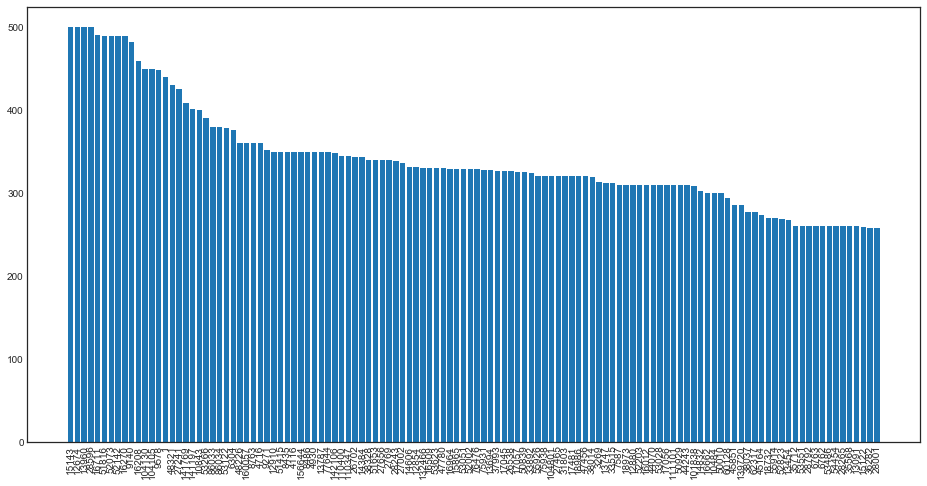

In [502]:
k = 120
topvotes = model_house_df.iloc[:,7:].sum().sort_values(ascending = False)
plt.figure(figsize=(16,8))
plt.bar(range(k),list(topvotes[:k]))
plt.xticks(range(k),list(topvotes[:k].index),rotation='vertical');

In [711]:
tempgdf = gdf.copy()
tempgdf["totalvote"] = tempgdf.ID.apply(lambda var: topvotes[var] )

# detail info of top k votes
topktable = tempgdf.sort_values("totalvote",ascending=False).drop(
    ["id_sum","IsMCC","CxHull","x","y","xradians","yradians","xyrID"],axis = 1)[:k]

In [714]:
# count the block in top k
topktable.Block.value_counts()[:5]

1553    3
0321    3
2141    3
1623    3
0339    3
Name: Block, dtype: int64

---
   Let's plot on the map
   
   - Color Map for total votes
   
   - Color Map for individual model (sing/total)
   
   - Color Map for the area are improved by the decision

In [717]:
tempgdf[(tempgdf.IsVacant == 0) & (tempgdf.totalvote > 0)]

,geometry,FullAddress,IsVacant,ID,IsMCC,BlockLot,CxHull,Block,x,xradians,y,yradians,yx,xyradians,xyrID,id_sum,totalvote


    * No solution recommends to demolish the non-vacant houeses *

- **Color Map for total votes**

In [9]:
import matplotlib.colors as colors

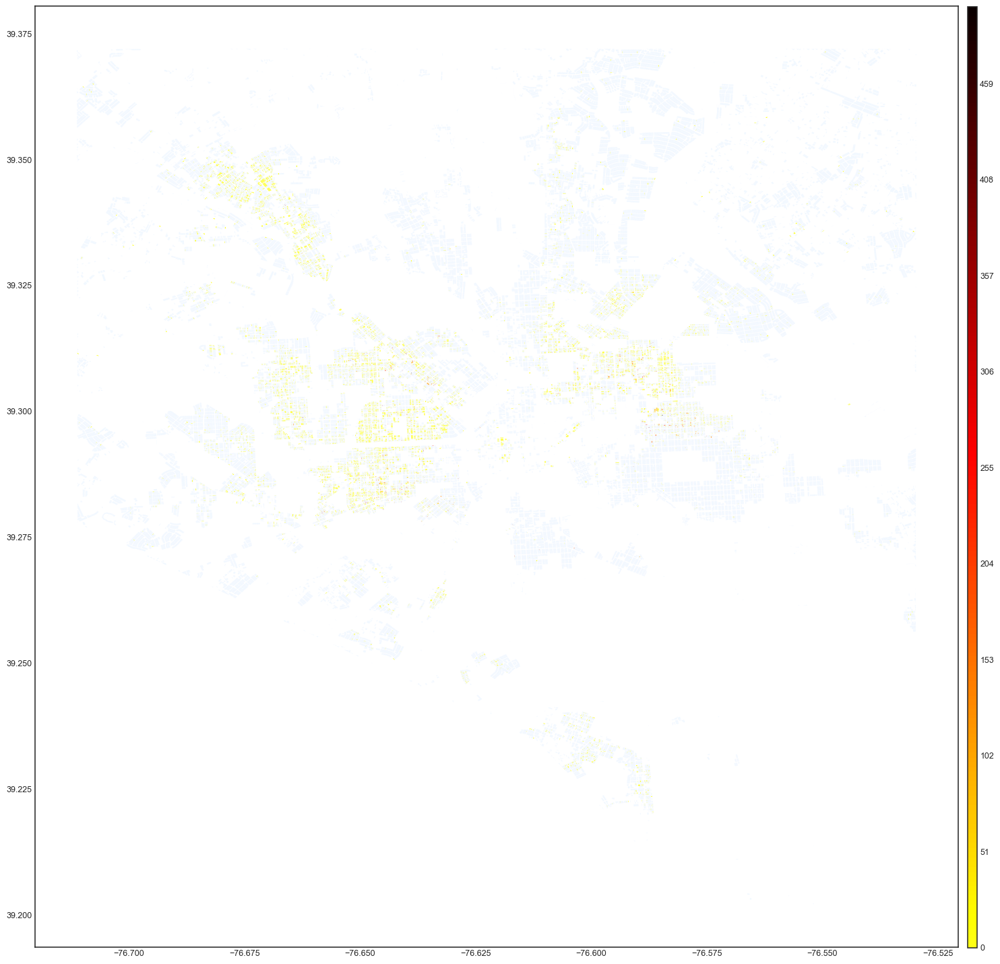

In [718]:
vmin_ = -150
colormap = 'hot_r'
nonvacantcolor = "aliceblue"

fig = plt.figure(1, figsize=(16,16), dpi=90)
ax = fig.add_subplot(111)
tempgdf[tempgdf.IsVacant == 1].plot(ax = ax, column = "totalvote",cmap = colormap ,vmin = vmin_ )
ogdf.plot(ax = ax, color = nonvacantcolor)

# add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.02 , 0.01, 0.97])
sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin_, vmax=tempgdf.totalvote.max()))

# fake up the array of the scalar mappable. Urgh...
sm._A = []
cb = fig.colorbar(sm, cax=cax, boundaries=np.arange(0,tempgdf.totalvote.max()+1))
fig.tight_layout()

# save figure
#fig.savefig('newimages/total_vote.eps',format='eps', dpi=1000,bbox_inches='tight')

- **Color Map for individual model (sing/total)** 1

In [553]:
# individual
file_ = files[0]
iter_ = 1
demolished = model_house_df[(model_house_df.model == file_) & (model_house_df.iter == iter_)].iloc[0,7:]

tempgdf = gdf.copy()
tempgdf["demolished"] = tempgdf.ID.apply(lambda var: demolished[var])

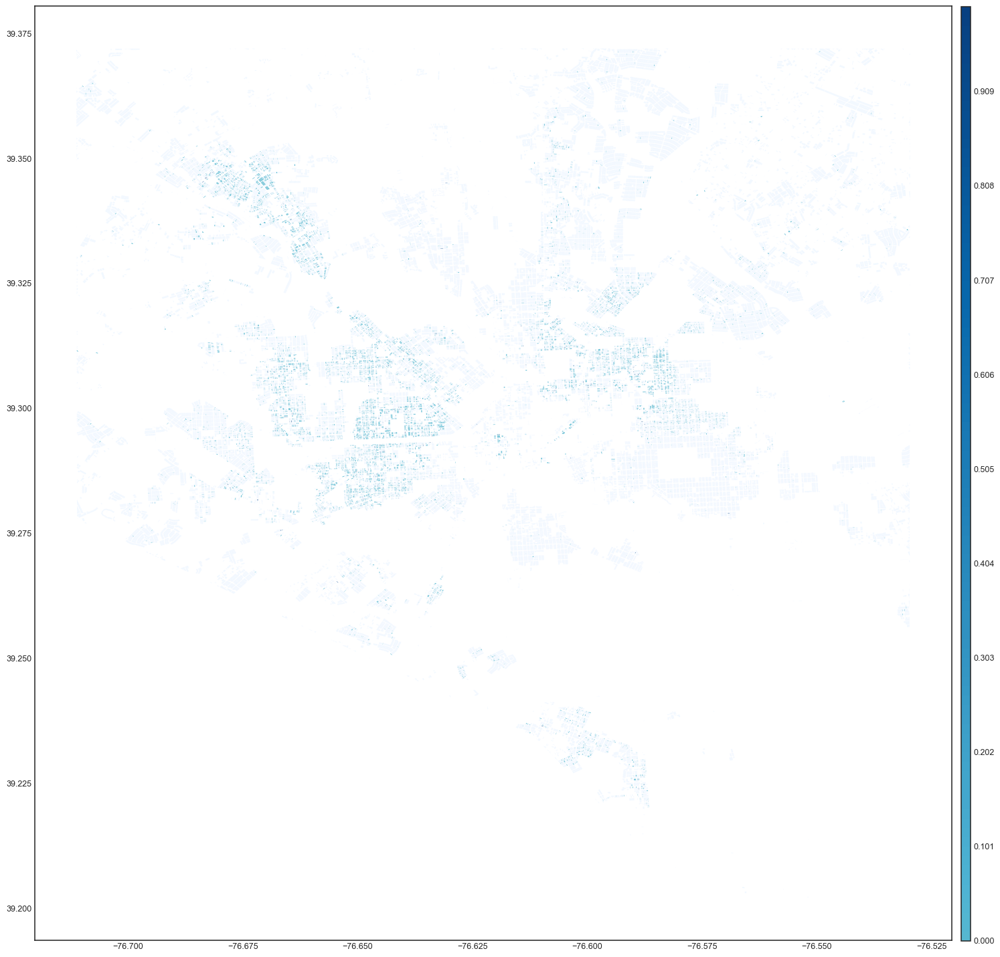

In [575]:
nonvacantcolor = "aliceblue"
colormap = "GnBu"
vmin_ = -1.5
vmax_ = 1.0

fig = plt.figure(1, figsize=(16,16), dpi=90)
ax = fig.add_subplot(111)
tempgdf[tempgdf.IsVacant == 1].plot(ax = ax, column = "demolished",cmap = colormap, vmin = vmin_, vmax = vmax_ )
ogdf.plot(ax = ax, color = nonvacantcolor)


# add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.02 , 0.01, 0.97])
sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin_, vmax=vmax_))
# fake up the array of the scalar mappable. Urgh...
sm._A = []
cb = fig.colorbar(sm, cax=cax, boundaries=np.linspace(0,1,100))
fig.tight_layout()


# save figure
#fig.savefig('newimages/{}_iter{}.eps'.format(file_,iter_),format='eps', dpi=1000,bbox_inches='tight')

In [574]:
# Total
file_ = files[0]
total = sum(model_house_df.model == file_)

demolished = model_house_df[(model_house_df.model == file_)].iloc[:,7:].sum()

tempgdf = gdf.copy()
tempgdf["demolished"] = tempgdf.ID.apply(lambda var: demolished[var])

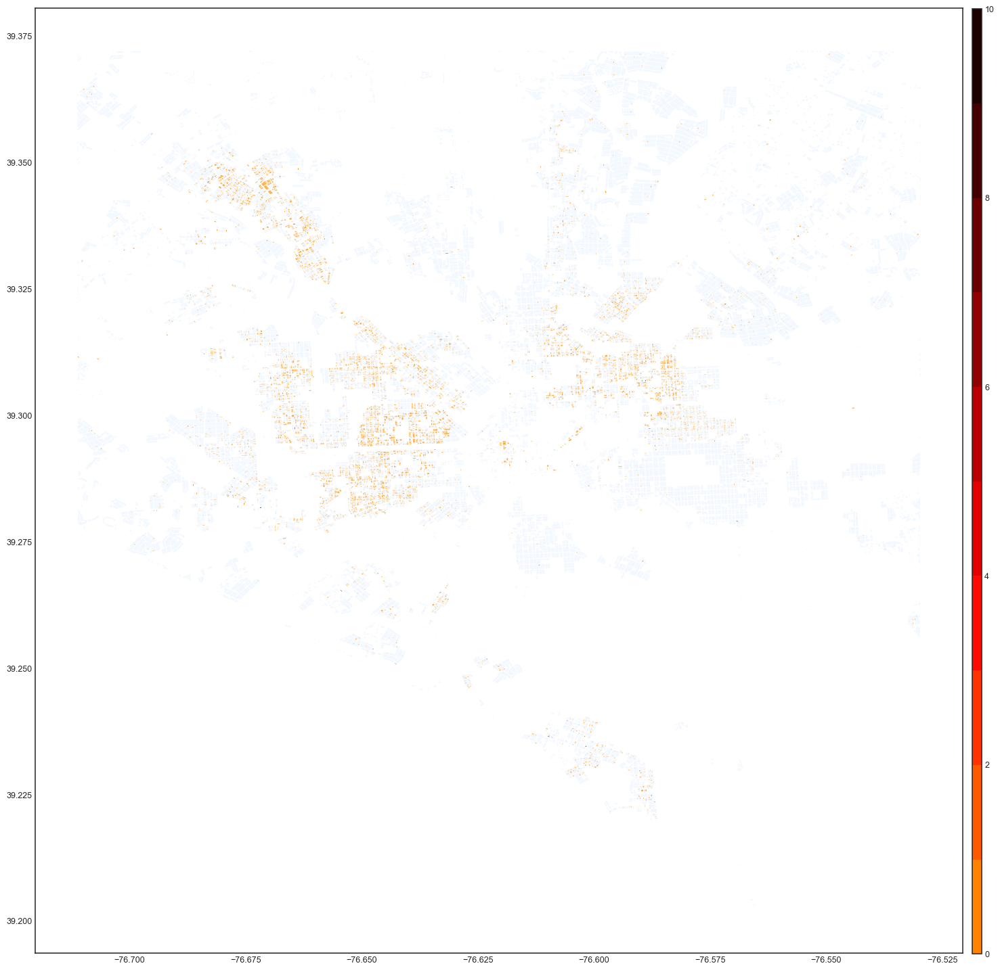

In [579]:
vmin_ = -7
colormap = 'hot_r'
nonvacantcolor = "aliceblue"

fig = plt.figure(1, figsize=(16,16), dpi=90)
ax = fig.add_subplot(111)
tempgdf[tempgdf.IsVacant == 1].plot(ax = ax, column = "demolished",cmap = colormap ,vmin = vmin_ )
ogdf.plot(ax = ax, color = nonvacantcolor)

# add colorbar
fig = ax.get_figure()
cax = fig.add_axes([1, 0.02 , 0.01, 0.97])
sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin_, vmax=tempgdf.demolished.max()))
# fake up the array of the scalar mappable. Urgh...
sm._A = []
cb = fig.colorbar(sm, cax=cax, boundaries=np.arange(0,tempgdf.demolished.max()+1))
fig.tight_layout()

# save figure
#fig.savefig('newimages/{}_total{}.eps'.format(file_,total),format='eps', dpi=1000,bbox_inches='tight')

- Color Map for the area are improved by the decision

In [101]:
def real_dis_affect(col,col2,power = 1, upper = 500):
    lon1, lat1 = col
    lon2, lat2 = col2
    R = 6373.0
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    dis = R * c*1000 
    #return dis if dis < upper else 0

    return 1.0/(dis**power) if dis < upper else 0

In [198]:
def Area_plot(file_ ,iter_, budg , ax,radius = None, power = None):
    #print file_,iter_
    demolished = model_house_df[(model_house_df.model == file_) & (model_house_df.iter == iter_) & 
                                (model_house_df.budg == budg)].iloc[0,7:]

    tempgdf = gdf.copy()
    tempgdf["demolished"] = tempgdf.ID.apply(lambda var: demolished[var])

    if not radius:
        radius = int(file_.split("-")[1][1:])
        power = int(file_.split("-")[2][1:])
    
    
    tempogdf = ogdf.copy()
    tempogdf["improve"] = np.zeros(len(tempogdf))
    tempogdf.set_index('ID',inplace = True)
    
    # try get the object value again.......QQ
    count = 0
    for id_ in tempgdf[tempgdf.demolished == 1].ID:
        
        index = tempogdf[((tempogdf.xradians <= vgdf[vgdf.ID == id_].xradians.iloc[0] + 0.00012) & 
        (tempogdf.xradians >= vgdf[vgdf.ID == id_].xradians.iloc[0] - 0.00012) &
        (tempogdf.yradians <= vgdf[vgdf.ID == id_].yradians.iloc[0] + 0.0001) & 
        (tempogdf.yradians >= vgdf[vgdf.ID == id_].yradians.iloc[0] - 0.0001) )].index

        
        curpoint = vgdf[vgdf.ID == id_].xyradians.iloc[0]
            
        curval = list(tempogdf.loc[index,"xyrID"].apply(
            lambda var: real_dis_affect(var[0],curpoint,
                                        power = power,upper = radius)))
        tempogdf.loc[index,"improve"] += curval
        
        if sum(curval) == 0:
            print "value error"
        
        count += 1
        
    #return tempogdf
    #xcoord = vgdf[ (vgdf.ID.apply(lambda var: var in set(tempgdf[tempgdf.demolished == 1].ID)))  ].geometry.centroid.x
    #ycoord = vgdf[ (vgdf.ID.apply(lambda var: var in set(tempgdf[tempgdf.demolished == 1].ID)))  ].geometry.centroid.y
    
    # color map:
    ##   hot_r, cubehelix, gnuplot2, inferno
    vmin_ = 0
    colormap = 'inferno'
    vacantcolor = "aliceblue"

    #fig = plt.figure(1, figsize=(16,16), dpi=150)
    #ax = fig.add_subplot(111)
    tempogdf.plot(ax = ax, column = "improve",cmap = colormap ,vmin = vmin_ )
    #tempgdf[(tempgdf.IsVacant == 1) & (tempgdf.demolished == 1)].plot(ax = ax,color = "r" )
    #tempgdf[(tempgdf.IsVacant == 1) & (tempgdf.demolished == 0)].plot(ax = ax,color = vacantcolor )
    #plt.scatter(x=xcoord, y=ycoord, alpha=0.8, c='r',s = 1200)
    # add colorbar
    #fig = ax.get_figure()
    #cax = fig.add_axes([1, 0.02 , 0.01, 0.97])
    sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin_, vmax=tempogdf.improve.max()))
    # fake up the array of the scalar mappable. Urgh...
    sm._A = []
    cb = fig.colorbar(sm, ax= ax, boundaries=np.linspace(0,tempogdf.improve.max(),101))
    fig.tight_layout()

    # save figure
    #if not radius:
    #    fig.savefig('newimages/{}_iter{}_budg{}_area.pdf'.format(file_,iter_,budg),format='pdf', dpi=1000,bbox_inches='tight')
    #else:
    #    fig.savefig('newimages/{}_d{}_p{}_iter{}_budg{}_area.pdf'.format(file_,radius,power,iter_,budg),format='pdf', dpi=1000,bbox_inches='tight')
    
    #return tempogdf

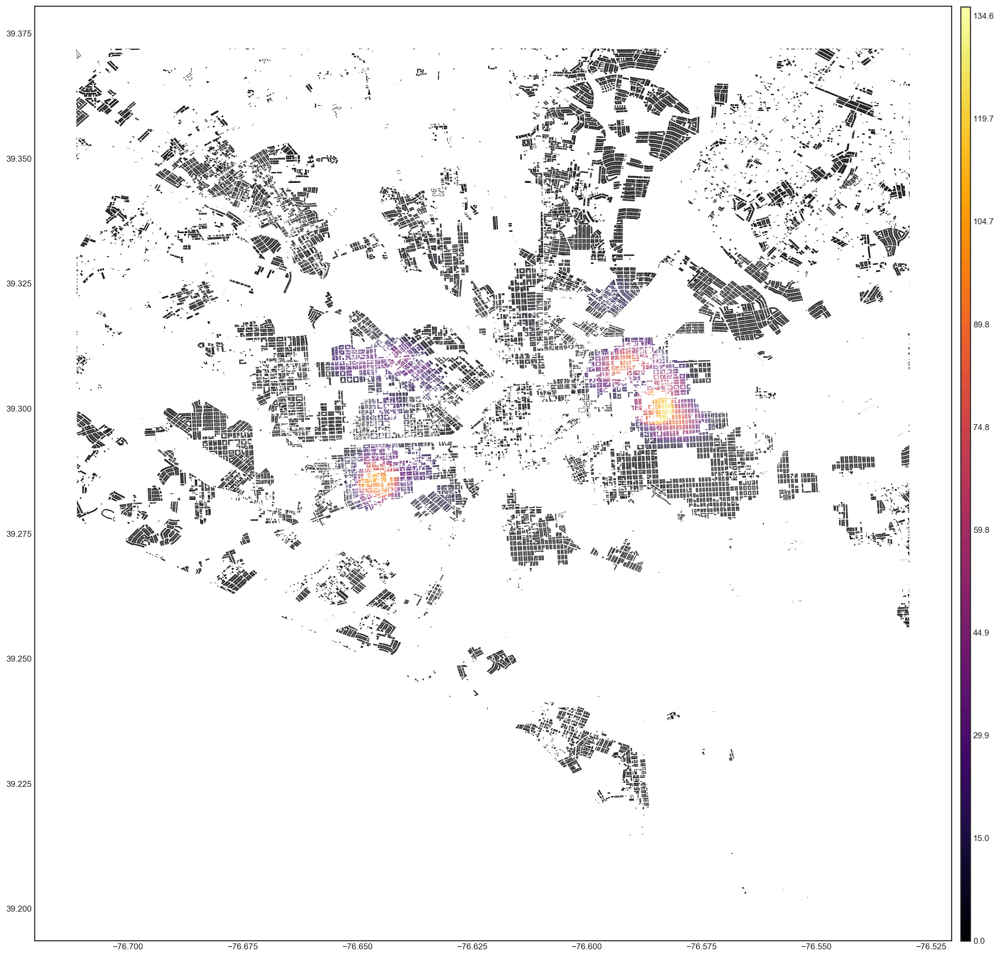

In [190]:
Area_plot("model-d400-p0" ,iter_, 10000000)

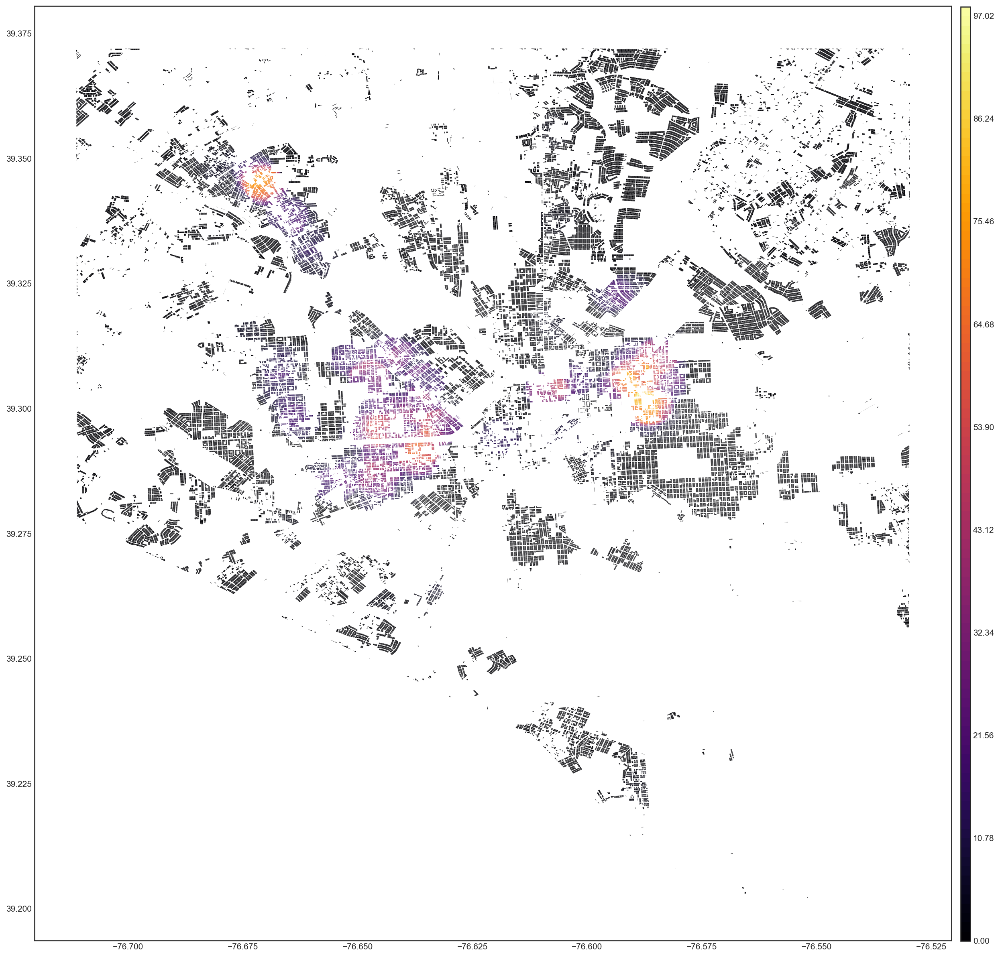

In [193]:
Area_plot("base" ,iter_, 10000000,400, 0)

***

# Maximize the demolished houses (Compare)

In [31]:
Budget = 5000000
demolish_2_story, demolish_3_story = 13000, 22000
r_relocate, o_relocate = 85000, 170000
wall_2_story, wall_3_story = 14000, 25000
cost_reduction = 0

# cost
Cost = [ 13000 +
      (85000 if gdf.loc[i,"IsVacant"]== 0 else 0) 
        for i in gdf.index ]

# Rdduction
Benefit = [ cost_reduction
             for i in xrange(len(edf))]

# 01-10-18
wi = [ 14000 
     for i in xrange(len(edf))]

wj = [ 14000 
         for i in xrange(len(edf))]

In [27]:
basic = Model() # empty
basic.Params.Threads = 4
basic.Params.MIPGap = 0.000001
bx = basic.addVars(gdf.ID,vtype = GRB.BINARY,name = "x")
by = basic.addVars(edgetuple,vtype = GRB.BINARY,name = "y")


basic.update()
bBudget_Constraint = basic.addConstr((quicksum(Cost[i]*bx[gdf.ID.iloc[i]] for i in xrange(len(gdf))) -
                     quicksum((Benefit[i]+wi[i]+wj[i])*by[edgetuple[i]] for i in xrange(len(edgetuple))) +
                     quicksum(wi[i]*bx[edgetuple[i][1]] for i in xrange(len(edgetuple))) +
                     quicksum(wj[i]*bx[edgetuple[i][0]] for i in xrange(len(edgetuple))) 
                     <= 
                     Budget 
                    )
                     , name = "Budget_Constraint")

bCD1 = basic.addConstrs((bx[edgetuple[i][1]] + bx[edgetuple[i][0]] - by[edgetuple[i]] <= 1 
                      for i in xrange(len(edgetuple))
                     ),name = "CD1")

bCD2 = basic.addConstrs((-bx[edgetuple[i][1]]  + by[edgetuple[i]] <= 0 
                      for i in xrange(len(edgetuple))
                     ),name = "CD2")

bCD3 = basic.addConstrs((-bx[edgetuple[i][0]]  + by[edgetuple[i]] <= 0 
                      for i in xrange(len(edgetuple))
                     ),name = "CD3")

Changed value of parameter Threads to 4
   Prev: 0  Min: 0  Max: 1024  Default: 0
Changed value of parameter MIPGap to 1e-06
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001


In [28]:
basic.setObjective( quicksum(bx[i] for i in gdf.ID), GRB.MAXIMIZE)
basic.optimize()

Optimize a model with 397468 rows, 308963 columns and 1236386 nonzeros
Variable types: 0 continuous, 308963 integer (308963 binary)
Coefficient statistics:
  Matrix range     [1e+00, 2e+05]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 5e+06]
Found heuristic solution: objective 52
Presolve removed 0 rows and 22501 columns
Presolve time: 3.31s
Presolved: 397468 rows, 286462 columns, 1213885 nonzeros
Variable types: 0 continuous, 286462 integer (286460 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   83090    2.9547805e+04   1.412894e+05   0.000000e+00      5s
  143042    9.7124242e+03   1.848173e+04   0.000000e+00     37s
  145665    9.7124242e+03   1.848173e+04   0.000000e+00     66s
  148290    9.7124213e+03   1.847873e+04   0.000000e+00     98s
  150916    9.7124182e+03   1.847873e+04   0.000000e+00    131s
  153544    9.7124152e+03   1.847873e+04   0.000000e+00    164s
  157905    6.0475

In [29]:
spent = (sum(Cost[i]*bx[gdf.ID.iloc[i]].X for i in xrange(len(gdf))) -
                 sum((Benefit[i]+wi[i]+wj[i])*by[edgetuple[i]].X for i in xrange(len(edgetuple))) +
                 sum(wi[i]*bx[edgetuple[i][1]].X for i in xrange(len(edgetuple))) +
                 sum(wj[i]*bx[edgetuple[i][0]].X for i in xrange(len(edgetuple))) )

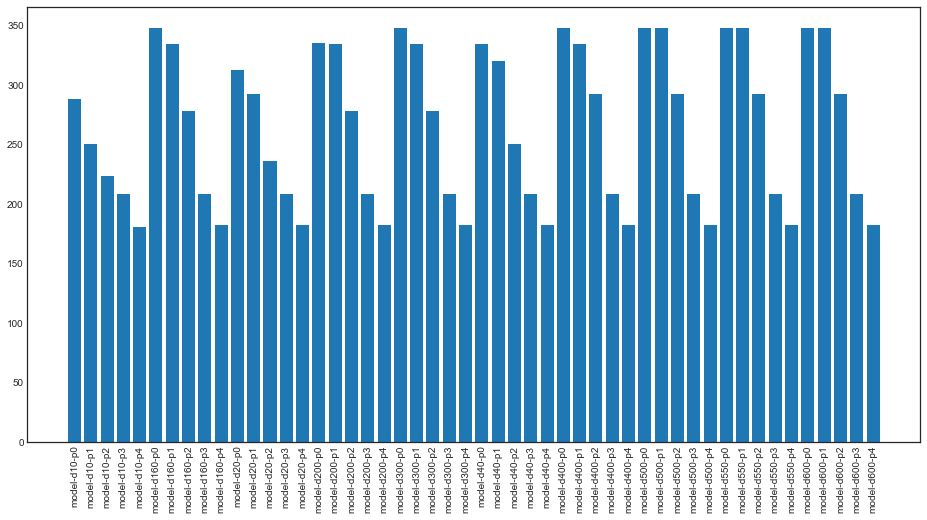

In [757]:
models_mean_house = model_house_df.groupby("model").Num_of_houses.mean()
plt.figure(figsize=(16,8))
plt.bar(range(50),list(models_mean_house))
plt.xticks(range(50),list(models_mean_house.index),rotation='vertical');

# Top Block

In [336]:
def top_block_plot(t = 20):
    
    gdf_copy = gdf.copy()
    id_sum = model_house_df.iloc[:,7:].sum()
    gdf_copy["id_sum"] = gdf_copy.ID.apply(lambda var: id_sum[var])
    
    top = gdf_copy.groupby("Block").id_sum.sum().sort_values(ascending = False)[:t]
    fig = plt.figure(2, figsize=(16,32), dpi=90)
    ax2 = fig.add_subplot(211)
    ax2.bar(range(t),top.values)
    ax2.set_xticks(range(t))
    ax2.set_xticklabels(list(top.index),rotation='vertical');
    
    
    ax = fig.add_subplot(212)
    gdf.plot(ax= ax,color = "grey")
    gdf[gdf.Block.apply(lambda var: var in set(top.index))].plot(ax = ax,color = "seagreen")
    return top

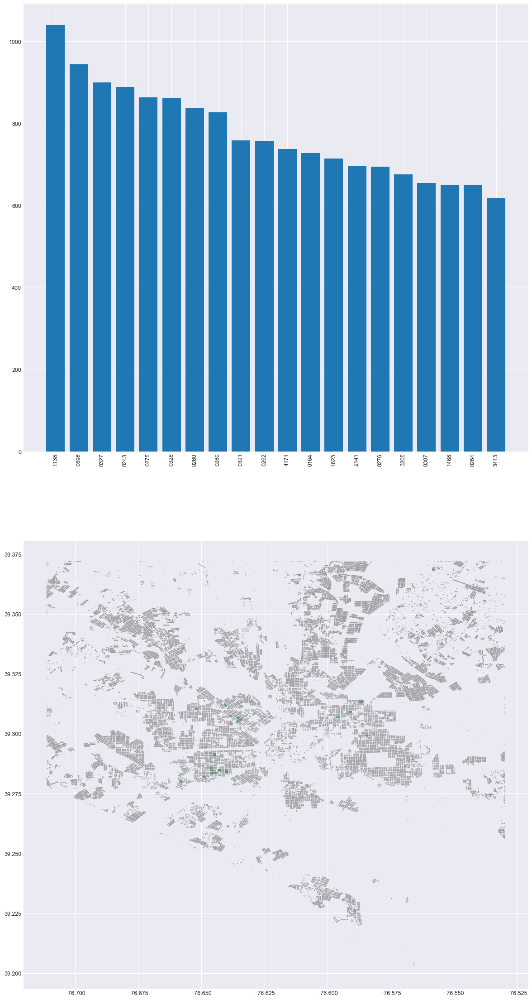

In [373]:
top_block = top_block_plot(20)

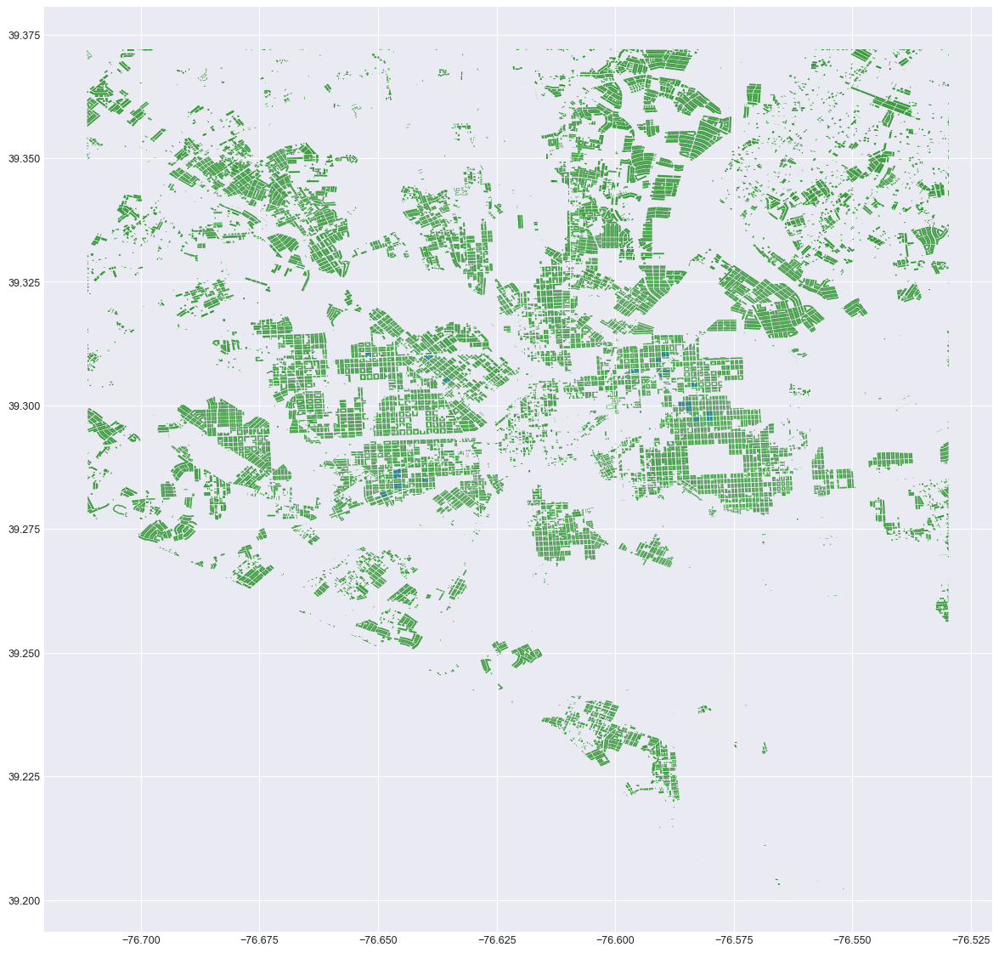

In [106]:
# plot and save in eps,svg
fig = plt.figure(1, figsize=(16,16), dpi=90)
ax = fig.add_subplot(111)

gdf.plot(ax = ax,color = "g")
gdf[gdf.Block.apply(lambda var: var in set(top_20_bolock_xy.index))].plot(ax = ax)

# Conclusion

> trade-off

> $$ \min w_{i,j}(1-x_i)(1-x_j) - \lambda \sum x_i $$

> How to chooses lambda

In [761]:
rmodel, rx, ry, rbigM= read_model("model/" + files[-1])
rmodel.params.MIPGap = 0.000000001
solver = LPSolve(rmodel,rx,ry,rbigM)
solver.budget_constraint()
#solver.set_objective()

Set parameter Threads to value 4
Read parameters from file model/model-d600-p4.prm
Changed value of parameter MIPGap to 1e-09
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001


In [762]:
lambda_ = 0.1
solver.model.setObjective( quicksum(solver.bigM[i] for i in vgdf.ID) + quicksum(solver.x[i] for i in gdf.ID) ,
                          GRB.MAXIMIZE)

In [763]:
solver.solve()

Optimize a model with 413194 rows, 324689 columns and 37319793 nonzeros
Variable types: 15726 continuous, 308963 integer (308963 binary)
Coefficient statistics:
  Matrix range     [8e-12, 2e+05]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e-08, 5e+06]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Found heuristic solution: objective 5.60012
Presolve removed 12 rows and 12 columns (presolve time = 5s) ...
Presolve removed 12 rows and 12 columns (presolve time = 10s) ...
Presolve removed 12 rows and 7505 columns (presolve time = 23s) ...
Presolve removed 12 rows and 7505 columns (presolve time = 26s) ...
Presolve removed 12 rows and 7505 columns (presolve time = 31s) ...
Presolve removed 12 rows and 7508 columns (presolve time = 35s) ...
Presolve removed 12 rows and 7508 columns (presolve time = 40s) ...
Presolve removed 12 rows and 7508 columns (presolve time = 47s) ...
Presolve rem

In [764]:
sum(solver.x[i].x for i in gdf.ID)

384.0

#### reference

http://gis-baltimore.opendata.arcgis.com/datasets?q=economic


- **color**

    https://stackoverflow.com/questions/35000251/make-a-scatter-colorbar-display-only-a-subset-of-the-vmin-vmax
    
    https://stackoverflow.com/questions/8342549/matplotlib-add-colorbar-to-a-sequence-of-line-plots/11558629#11558629
    
    